# Importing Libraries

In [1]:
import pandas as pd
import string
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud,STOPWORDS

from textblob import TextBlob
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
nltk.download('punkt')
from collections import Counter

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Uploading Dataset

In [2]:

df=pd.read_csv("C:/Users/USER/Downloads/Data Science Projects/mental_health.csv")
df.head()

,text,label
0,dear american teens question dutch person hear...,0
1,nothing look forward lifei dont many reasons k...,1
2,music recommendations im looking expand playli...,0
3,im done trying feel betterthe reason im still ...,1
4,worried year old girl subject domestic physic...,1


# Data Preprocessing

In [3]:
df['text']=df['text'].apply(str.lower)
df["text"] = df['text'].str.replace('[^\w\s]','')

C:\Users\USER\AppData\Local\Temp\ipykernel_9292\2390235465.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df["text"] = df['text'].str.replace('[^\w\s]','')


# Using NLTK

In [11]:
po_nltk=0
neg_nltk=0
neu_nltk=0
filtered=[]
for i in df['text']:
    # Tokenization - breaking text into words
    words = word_tokenize(i.lower())  # Convert to lowercase for consistency

    # Add NLTK stopwords to the existing set
    stopwords = set(STOPWORDS)
    filtered_words = [word for word in words if word.isalnum() and word not in stopwords]
    filtered.append(filtered_words)
    sia = SentimentIntensityAnalyzer()
    sentiment_score = sia.polarity_scores(' '.join(filtered_words))
    
    if sentiment_score['compound']>=0.05:
        po_nltk+=1
    elif sentiment_score['compound']<=0.05:
        neg_nltk+=1
    else:
        neu_nltk+=1
print(po_nltk, neg_nltk,neu_nltk)


11527 16450 0


In [12]:
flat_list = ' '.join([item for sublist in filtered for item in sublist])
flat_list

'dear american teens question dutch person heard guys way easier things learn age us sooooo thth graders right guys learn math nothing look forward lifei dont many reasons keep going feel nothing keeps going next day makes want hang music recommendations im looking expand playlist usual genres alt pop minnesota hip hop steampunk various indie genres artists people cavetown aliceband bug hunter penelope scott various rhymesayers willing explore new genresartists anything generic rap type exclusively sex drugs cool rapper rap types pretty good pop popular couple years ago dunno technical genre name anyways anyone got music recommendations favorite artistssongs im done trying feel betterthe reason im still alive know mum devastated killed passes im still state im going hesitate ending life shortly im almost take meds go therapy nothing seems help enough dont want around anymore hate feeling wouldnt wish upon enemy brain feels constantly static tv wont shut overthinking think im running op

In [16]:
# Add custom stopwords
unused_word = set(['one', 'ive', 'im','you','us','very','want','can','cant','get','even'])

# Remove custom stopwords from the text
for s in unused_word:
    text2 = flat_list.replace(s, '')

# Wordcloud with the frequent used words

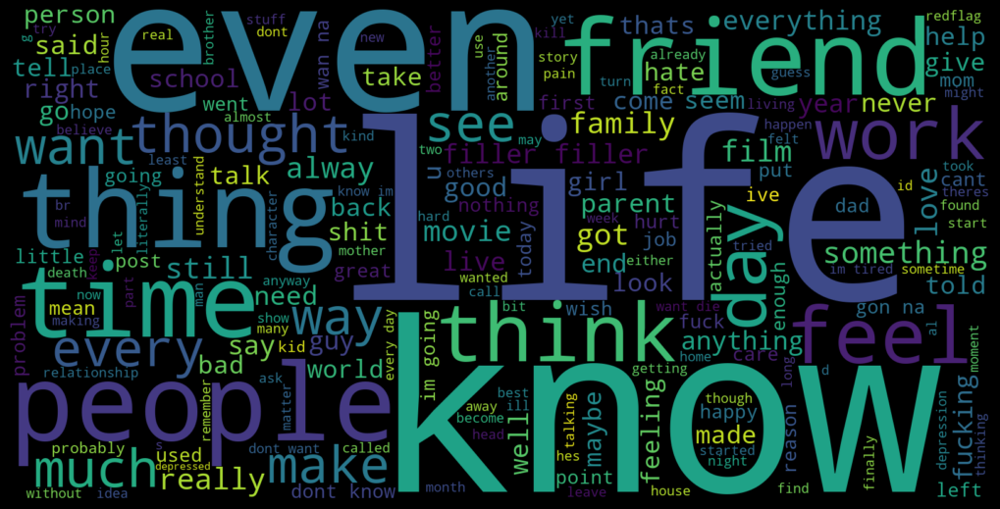

In [44]:
wordcloud=WordCloud(stopwords=STOPWORDS,width=1600, height=800, background_color='black').generate(text2)
plt.figure(figsize=(10,10),facecolor='k')
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# Bar Graph

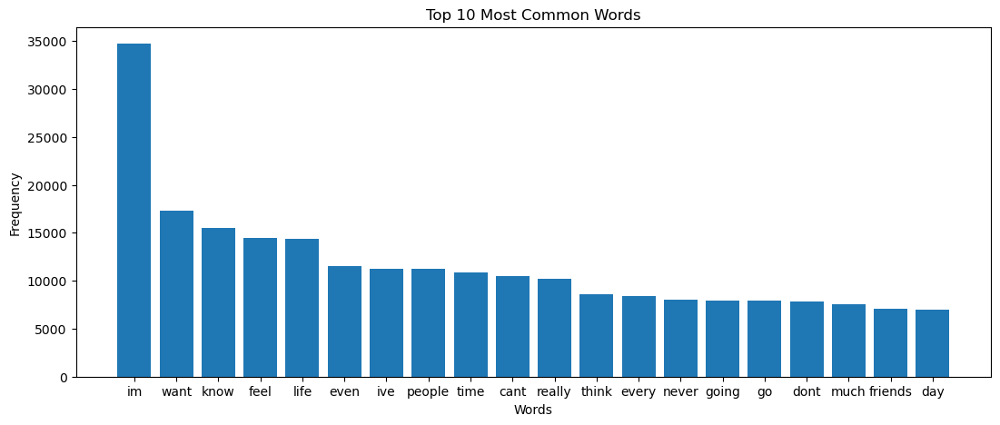

In [19]:
# Tokenize the text into words
words = text2.split()

# Count the occurrences of each word
word_counts = Counter(words)

# Get the top 10 most common words
top_words = word_counts.most_common(20)

# Extract words and their counts for plotting
top_words, counts = zip(*top_words)

# Create a bar graph
plt.figure(figsize=(13,5))
plt.bar(top_words, counts)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 10 Most Common Words')
plt.show()

# Horizontal Bar Graph Without Unwanted Words

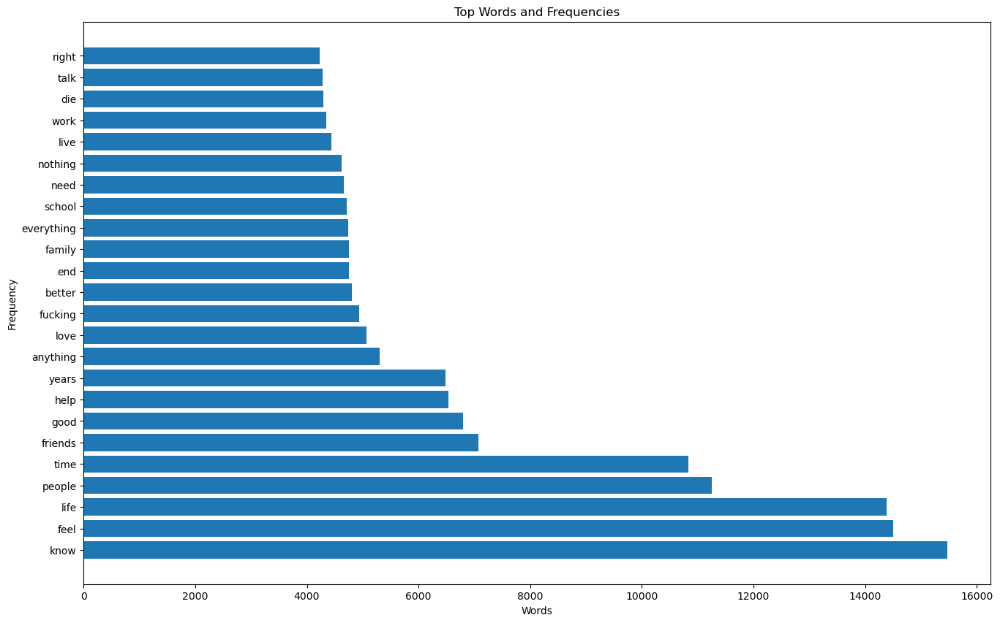

In [42]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter

# Sample text data
text_data = "Your text data goes here."

# Tokenize and remove stopwords
nltk_stopwords = set(stopwords.words("english"))
custom_stopwords = set(STOPWORDS)
combined_stopwords = nltk_stopwords.union(custom_stopwords)

words = word_tokenize(text2)
filtered_words = [word.lower() for word in words if word.isalnum() and word.lower() not in combined_stopwords]

# Count word frequencies
word_freq = Counter(filtered_words)

# Get the top N words and their frequencies
top_words = word_freq.most_common(50)

# Manually remove unwanted words
unwanted_words = {'one', 'im', 'ive','even','really','day','go','going','want','got','way','still','every','much','make','things','br','something','think','always','and','cant','dont','back','anymore','never','see','say'}  
filtered_top_words = [(word, freq) for word, freq in top_words if word not in unwanted_words]

# Create a bar graph
plt.figure(figsize=(16,10))
plt.barh(*zip(*filtered_top_words))
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top Words and Frequencies')
plt.show()
